In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Download historical data for Natural Gas Futures
data = yf.download('NG=F', start='2015-01-01', end='2020-12-31')

# Display the first few rows
print(data.head())

[*********************100%***********************]  1 of 1 completed

             Open   High    Low  Close  Adj Close  Volume
Date                                                     
2015-01-02  2.845  3.096  2.805  3.003      3.003  109122
2015-01-05  3.076  3.176  2.875  2.882      2.882  141783
2015-01-06  2.921  2.955  2.811  2.938      2.938  111338
2015-01-07  2.949  3.012  2.825  2.871      2.871  134826
2015-01-08  2.877  2.968  2.816  2.927      2.927  147797


In [3]:
# Use the 'Close' price for consistency
data = data[['Close']].dropna()
data.rename(columns={'Close': 'Price'}, inplace=True)

# Compute logarithmic prices
data['LogPrice'] = np.log(data['Price'])

# Compute daily log returns
data['LogReturn'] = data['LogPrice'].diff()

# Drop NaN values
data = data.dropna()

# Display the data
print(data.head())

            Price  LogPrice  LogReturn
Date                                  
2015-01-05  2.882  1.058484  -0.041127
2015-01-06  2.938  1.077729   0.019245
2015-01-07  2.871  1.054660  -0.023069
2015-01-08  2.927  1.073978   0.019318
2015-01-09  2.946  1.080448   0.006470


In [4]:
# Calculate delta X_t and X_{t-1}
data['X_t-1'] = data['LogPrice'].shift(1)
data['DeltaX_t'] = data['LogPrice'] - data['X_t-1']

# Drop NaN values
data = data.dropna()

# Prepare variables for regression
X = data['X_t-1'].values
Y = data['DeltaX_t'].values

# Perform OLS regression
import statsmodels.api as sm

X = sm.add_constant(X)  # Adds a constant term to the predictor
model = sm.OLS(Y, X)
results = model.fit()

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     9.864
Date:                Sun, 27 Oct 2024   Prob (F-statistic):            0.00172
Time:                        17:06:55   Log-Likelihood:                 3080.1
No. Observations:                1506   AIC:                            -6156.
Df Residuals:                    1504   BIC:                            -6146.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0123      0.004      3.049      0.0

In [5]:
# Extract coefficients
a = results.params[0]
b = results.params[1]

delta_t = 1/252  # Assuming 252 trading days in a year

# Compute kappa and theta
kappa = -b / delta_t
theta = a / (kappa * delta_t)
sigma_hat = np.sqrt(results.mse_resid / delta_t)

print(f"Estimated kappa: {kappa}")
print(f"Estimated theta: {theta}")
print(f"Estimated sigma: {sigma_hat}")

Estimated kappa: 3.2726367021941645
Estimated theta: 0.9478869199283232
Estimated sigma: 0.497186100097961


In [6]:
num_simulations = 1000  # Number of simulated paths
T = 252  # Time horizon (1 year of trading days)
dt = 1/252  # Time step
S0 = data['Price'].iloc[-1]  # Last observed price

In [7]:
# Preallocate arrays
simulated_log_prices = np.zeros((T, num_simulations))
simulated_log_prices[0] = np.log(S0)

# Simulate paths
for t in range(1, T):
    # Generate random shocks
    epsilon = np.random.normal(size=num_simulations)
    
    # Previous prices
    X_t_minus_1 = simulated_log_prices[t-1]
    
    # Mean reversion
    simulated_log_prices[t] = X_t_minus_1 + kappa * (theta - X_t_minus_1) * dt + sigma_hat * np.sqrt(dt) * epsilon

# Convert log prices to prices
simulated_prices = np.exp(simulated_log_prices)

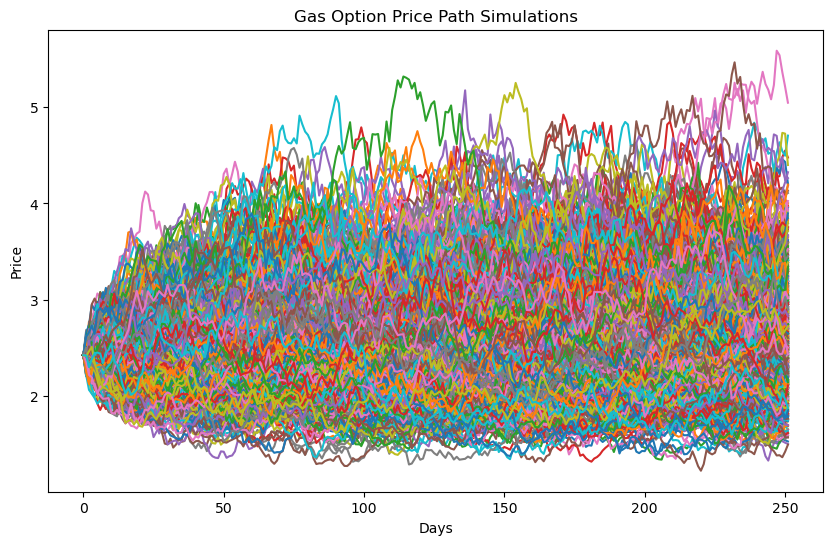

In [8]:
plt.figure(figsize=(10,6))
plt.plot(simulated_prices)
plt.title('Gas Option Price Path Simulations')
plt.xlabel('Days')
plt.ylabel('Price')
plt.show()

In [9]:
K = S0 * 1.05  # Strike price is 5% above current price
N_swings = 5  # Number of swing rights
DCQ = 10000  # Daily Contract Quantity
minDCQ = 2500
maxDCQ = 15000
r = 0.01  # Risk-free rate (1%)

In [10]:
def price_swing_option(simulated_prices, K, r, dt, N_swings, DCQ, minDCQ, maxDCQ):
    num_days, num_paths = simulated_prices.shape
    option_values = np.zeros((num_days, num_paths))
    exercise_flags = np.zeros((num_days, num_paths), dtype=bool)
    remaining_swings = np.full(num_paths, N_swings)
    
    # Payoff function
    def payoff(S, K, DCQ, minDCQ, maxDCQ):
        # "Bang-bang" strategy: choose max payoff between upswing and downswing
        upswing_payoff = (maxDCQ - DCQ) * np.maximum(S - K, 0)
        downswing_payoff = (DCQ - minDCQ) * np.maximum(K - S, 0)
        return np.maximum(upswing_payoff, downswing_payoff)
    
    # Initialize the option values at maturity
    option_values[-1] = payoff(simulated_prices[-1], K, DCQ, minDCQ, maxDCQ)
    
    # Backward induction
    for t in reversed(range(num_days - 1)):
        # Only proceed if there are remaining swings
        in_the_money = (remaining_swings > 0)
        
        # Immediate exercise value
        immediate_exercise = payoff(simulated_prices[t], K, DCQ, minDCQ, maxDCQ)
        
        # Discounted future value
        future_value = option_values[t+1] * np.exp(-r * dt)
        
        # Regression to estimate continuation value
        X = simulated_prices[t][in_the_money]
        Y = future_value[in_the_money]
        
        # Use polynomial regression (e.g., degree 2)
        if len(X) > 0:
            poly = np.polyfit(X, Y, 4)
            continuation_value = np.polyval(poly, simulated_prices[t])
        else:
            continuation_value = future_value
        
        # Decide whether to exercise
        exercise = (immediate_exercise > continuation_value) & in_the_money
        
        # Update option values
        option_values[t] = np.where(exercise, immediate_exercise, future_value)
        exercise_flags[t] = exercise
        
        # Update remaining swings
        remaining_swings -= exercise.astype(int)
    
    # Calculate the option price
    option_price = np.mean(option_values[0]) * np.exp(-r * dt)
    
    return option_price, option_values, exercise_flags

In [12]:
option_price, option_values, exercise_flags = price_swing_option(
    simulated_prices, K, r, dt, N_swings, DCQ, minDCQ, maxDCQ)

print(f"Estimated Swing Option Price: {option_price:.2f}")

Estimated Swing Option Price: 3084.47


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_13059/221738716.py:1: RankWarning: Polyfit may be poorly conditioned
  option_price, option_values, exercise_flags = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_13059/221738716.py:1: RankWarning: Polyfit may be poorly conditioned
  option_price, option_values, exercise_flags = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_13059/221738716.py:1: RankWarning: Polyfit may be poorly conditioned
  option_price, option_values, exercise_flags = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_13059/221738716.py:1: RankWarning: Polyfit may be poorly conditioned
  option_price, option_values, exercise_flags = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_13059/221738716.py:1: RankWarning: Polyfit may be poorly conditioned
  option_price, option_values, exercise_flags = price_swing_option(
/var/folders/jz/jj88

In [14]:
market_option_price = option_price * (1 + np.random.normal(0, 0.05))

print(f"Simulated Market Swing Option Price: {market_option_price:.2f}")

Simulated Market Swing Option Price: 3038.57


In [15]:
if option_price > market_option_price:
    print("Trade Signal: BUY the swing option (undervalued).")
else:
    print("Trade Signal: SELL the swing option (overvalued).")

Trade Signal: BUY the swing option (undervalued).


In [16]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Set parameters
backtest_start = '2015-01-01'
backtest_end = '2020-10-06'
window_size = 252 * 2  # Use 2 years of data for parameter estimation

# Ensure data has the correct date range
data.index = pd.date_range(start='2015-01-01', periods=len(data), freq='B')

# Prepare date range for backtesting
dates = pd.date_range(start=backtest_start, end=backtest_end, freq='B')  # Business days
signals = []
model_prices = []
market_prices = []
dates_list = []

for current_date in dates:
    # Define estimation window
    estimation_end_date = current_date - pd.Timedelta(days=1)
    estimation_start_date = estimation_end_date - pd.Timedelta(days=window_size)

    # Check if we have enough data
    if estimation_start_date < data.index[0]:
        continue
    
    # Check if estimation_end_date exists in the index
    if estimation_end_date not in data.index:
        print(f"{estimation_end_date} not found in data index. Skipping.")
        continue  # Skip this iteration if the date is not found

    # Get estimation data
    estimation_data = data.loc[estimation_start_date:estimation_end_date]

    # Re-estimate parameters
    estimation_data.loc[:, 'X_t-1'] = estimation_data['LogPrice'].shift(1)
    estimation_data.loc[:, 'DeltaX_t'] = estimation_data['LogPrice'] - estimation_data['X_t-1']
    estimation_data = estimation_data.dropna()
    
    if estimation_data.empty:
        print(f"No estimation data available for {current_date}. Skipping.")
        continue

    X_est = estimation_data['X_t-1'].values
    Y_est = estimation_data['DeltaX_t'].values
    
    X_est = sm.add_constant(X_est)
    model_est = sm.OLS(Y_est, X_est)
    results_est = model_est.fit()
    
    a_est = results_est.params[0]
    b_est = results_est.params[1]
    
    # Compute kappa, theta, sigma
    kappa_est = -b_est / delta_t
    theta_est = a_est / (kappa_est * delta_t)
    sigma_est = np.sqrt(results_est.mse_resid / delta_t)
    
    # Simulate future prices
    simulated_log_prices = np.zeros((T, num_simulations))
    
    # Check if the price exists
    S0_est = data.loc[estimation_end_date, 'Price'] if estimation_end_date in data.index else None
    if S0_est is None:
        print(f"Initial price at {estimation_end_date} not found. Skipping.")
        continue
    
    simulated_log_prices[0] = np.log(S0_est)
    
    for t in range(1, T):
        epsilon = np.random.normal(size=num_simulations)
        X_t_minus_1 = simulated_log_prices[t-1]
        simulated_log_prices[t] = X_t_minus_1 + kappa_est * (theta_est - X_t_minus_1) * dt + sigma_est * np.sqrt(dt) * epsilon
    
    simulated_prices = np.exp(simulated_log_prices)
    
    # Price the option
    option_price_est, _, _ = price_swing_option(
        simulated_prices, K, r, dt, N_swings, DCQ, minDCQ, maxDCQ)
    
    # Simulate market price
    market_option_price_est = option_price_est * (1 + np.random.normal(0, 0.05))
    
    # Generate signal
    if option_price_est > market_option_price_est:
        signal = 1  # Buy
    else:
        signal = -1  # Sell
    
    # Store results
    signals.append(signal)
    model_prices.append(option_price_est)
    market_prices.append(market_option_price_est)
    dates_list.append(current_date)

# Create a DataFrame with the results
backtest_results = pd.DataFrame({
    'Date': dates_list,
    'Signal': signals,
    'ModelPrice': model_prices,
    'MarketPrice': market_prices
})
backtest_results.set_index('Date', inplace=True)

# Optionally print the results or perform additional analysis



/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-05-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-05-29 00:00:00 not found in data index. Skipping.
2016-06-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-06-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-06-19 00:00:00 not found in data index. Skipping.
2016-06-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-07-03 00:00:00 not found in data index. Skipping.
2016-07-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-07-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-07-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-07-31 00:00:00 not found in data index. Skipping.
2016-08-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-08-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-08-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-08-28 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-09-04 00:00:00 not found in data index. Skipping.
2016-09-11 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-09-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-09-25 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-10-02 00:00:00 not found in data index. Skipping.
2016-10-09 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-10-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-10-23 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-10-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-11-06 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-11-13 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-11-20 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-11-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-12-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-12-11 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-12-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2016-12-25 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-01-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-01-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-01-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-01-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-01-29 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-02-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-02-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-02-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-02-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-03-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-03-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-03-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-03-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-04-02 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-04-09 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-04-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-04-23 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-04-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-05-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-05-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-05-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-05-28 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-06-04 00:00:00 not found in data index. Skipping.
2017-06-11 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-06-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-06-25 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-07-02 00:00:00 not found in data index. Skipping.
2017-07-09 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-07-16 00:00:00 not found in data index. Skipping.
2017-07-23 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-07-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-08-06 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-08-13 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-08-20 00:00:00 not found in data index. Skipping.
2017-08-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-09-03 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-09-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-09-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-09-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-10-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-10-08 00:00:00 not found in data index. Skipping.
2017-10-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-10-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-10-29 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-11-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-11-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-11-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-11-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-12-03 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-12-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-12-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-12-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2017-12-31 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-01-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-01-14 00:00:00 not found in data index. Skipping.
2018-01-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-01-28 00:00:00 not found in data index. Skipping.
2018-02-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-02-11 00:00:00 not found in data index. Skipping.
2018-02-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-02-25 00:00:00 not found in data index. Skipping.
2018-03-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-03-11 00:00:00 not found in data index. Skipping.
2018-03-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-03-25 00:00:00 not found in data index. Skipping.
2018-04-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-04-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-04-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-04-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-04-29 00:00:00 not found in data index. Skipping.
2018-05-06 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-05-13 00:00:00 not found in data index. Skipping.
2018-05-20 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-05-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-06-03 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-06-10 00:00:00 not found in data index. Skipping.
2018-06-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-06-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-07-01 00:00:00 not found in data index. Skipping.
2018-07-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-07-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-07-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-07-29 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-08-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-08-12 00:00:00 not found in data index. Skipping.
2018-08-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-08-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-09-02 00:00:00 not found in data index. Skipping.
2018-09-09 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-09-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-09-23 00:00:00 not found in data index. Skipping.
2018-09-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-10-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-10-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-10-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-10-28 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-11-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-11-11 00:00:00 not found in data index. Skipping.
2018-11-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-11-25 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-12-02 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-12-09 00:00:00 not found in data index. Skipping.
2018-12-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2018-12-23 00:00:00 not found in data index. Skipping.
2018-12-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-01-06 00:00:00 not found in data index. Skipping.
2019-01-13 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-01-20 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-01-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-02-03 00:00:00 not found in data index. Skipping.
2019-02-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-02-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-02-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-03-03 00:00:00 not found in data index. Skipping.
2019-03-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-03-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-03-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-03-31 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-04-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-04-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-04-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-04-28 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-05-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-05-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-05-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-05-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-06-02 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-06-09 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-06-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-06-23 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-06-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-07-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-07-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-07-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-07-28 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-08-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-08-11 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-08-18 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-08-25 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-09-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-09-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-09-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-09-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-09-29 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-10-06 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-10-13 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-10-20 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-10-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-11-03 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-11-10 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-11-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-11-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-12-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-12-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-12-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-12-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2019-12-29 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-01-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-01-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-01-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-01-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-02-02 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-02-09 00:00:00 not found in data index. Skipping.
2020-02-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-02-23 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-03-01 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-03-08 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-03-15 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-03-22 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-03-29 00:00:00 not found in data index. Skipping.
2020-04-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-04-12 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-04-19 00:00:00 not found in data index. Skipping.
2020-04-26 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-05-03 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-05-10 00:00:00 not found in data index. Skipping.
2020-05-17 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-05-24 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-05-31 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-06-07 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-06-14 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-06-21 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-06-28 00:00:00 not found in data index. Skipping.
2020-07-05 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-07-12 00:00:00 not found in data index. Skipping.
2020-07-19 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-07-26 00:00:00 not found in data index. Skipping.
2020-08-02 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-08-09 00:00:00 not found in data index. Skipping.
2020-08-16 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-08-23 00:00:00 not found in data index. Skipping.
2020-08-30 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-09-06 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-09-13 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-09-20 00:00:00 not found in data index. Skipping.
2020-09-27 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

2020-10-04 00:00:00 not found in data index. Skipping.


/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly conditioned
  option_price_est, _, _ = price_swing_option(
/var/folders/jz/jj88ljvn3ln0hblw4zdfs1cw0000gn/T/ipykernel_12337/894196360.py:80: RankWarning: Polyfit may be poorly con

In [63]:
if len(data) == expected_length:  # Replace expected_length with your expected number of rows
    data.index = pd.date_range(start='2015-01-01', periods=len(data), freq='B')
else:
    print("Length of data does not match expected period.")

In [ ]:
# backtest_start = '2015-01-01'
backtest_end = '2020--31'
expected_length = len(pd.date_range(start=backtest_start, end=backtest_end, freq='B'))
expected_length


In [54]:
data.head()

,Price,LogPrice,LogReturn,X_t-1,DeltaX_t
2015-01-01,2.927,1.073978,0.019318,1.054660,0.019318
2015-01-02,2.946,1.080448,0.006470,1.073978,0.006470
2015-01-05,2.795,1.027832,-0.052616,1.080448,-0.052616
2015-01-06,2.943,1.079429,0.051597,1.027832,0.051597
2015-01-07,3.233,1.173411,0.093981,1.079429,0.093981


In [55]:
data.tail()

,Price,LogPrice,LogReturn,X_t-1,DeltaX_t
2020-09-30,2.608,0.958584,-0.063867,1.022451,-0.063867
2020-10-01,2.518,0.923465,-0.035119,0.958584,-0.035119
2020-10-02,2.305,0.835081,-0.088384,0.923465,-0.088384
2020-10-05,2.467,0.903003,0.067922,0.835081,0.067922
2020-10-06,2.422,0.884594,-0.018409,0.903003,-0.018409


In [65]:
print(dates)

DatetimeIndex(['2015-01-01', '2015-01-02', '2015-01-05', '2015-01-06',
               '2015-01-07', '2015-01-08', '2015-01-09', '2015-01-12',
               '2015-01-13', '2015-01-14',
               ...
               '2020-09-23', '2020-09-24', '2020-09-25', '2020-09-28',
               '2020-09-29', '2020-09-30', '2020-10-01', '2020-10-02',
               '2020-10-05', '2020-10-06'],
              dtype='datetime64[ns]', length=1504, freq='B')


In [77]:
x = []

In [78]:
if estimation_end_date not in data.index:
    x.append(estimation_end_date)

In [76]:
full_date_range = pd.date_range(start=data.index.min(), end=data.index.max(), freq='B')
missing_dates = full_date_range[~full_date_range.isin(data.index)]
print("Missing Dates:", missing_dates)

Missing Dates: DatetimeIndex([], dtype='datetime64[ns]', freq='B')


In [88]:
backtest_results.tail()

,Signal,ModelPrice,MarketPrice,PnL,CumulativePnL
Date,,,,,
2020-09-29,1,3641.083870,3565.827638,75.256231,1.854764e+18
2020-09-30,-1,3808.729608,4067.001540,258.271932,1.854764e+18
2020-10-01,1,3680.452331,3595.968647,84.483684,1.854764e+18
2020-10-02,-1,3733.015938,3782.634168,49.618230,1.854764e+18
2020-10-06,-1,3755.697423,3913.941226,158.243803,1.854764e+18


In [17]:
print(backtest_results.head())

            Signal   ModelPrice  MarketPrice
Date                                        
2016-05-20      -1  2841.596656  3150.689649
2016-05-24      -1  2736.224127  2809.710423
2016-05-25      -1  2668.406124  2730.687177
2016-05-26      -1  2723.506631  2726.057984
2016-05-27       1  2672.568110  2659.565784


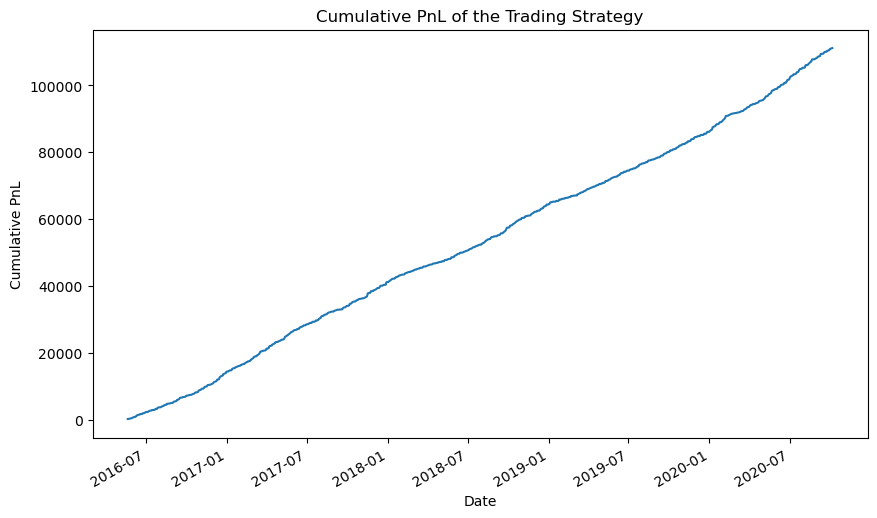

In [18]:
backtest_results['PnL'] = (backtest_results['ModelPrice'] - backtest_results['MarketPrice']) * backtest_results['Signal']

# Calculate cumulative PnL
backtest_results['CumulativePnL'] = backtest_results['PnL'].cumsum()

# Plot cumulative PnL
plt.figure(figsize=(10,6))
backtest_results['CumulativePnL'].plot()
plt.title('Cumulative PnL of the Trading Strategy')
plt.xlabel('Date')
plt.ylabel('Cumulative PnL')
plt.show()

In [19]:
# Assuming you have defined your risk-free rate, for example:
risk_free_rate = 0.01/252  # Annual risk-free rate (e.g., 1%) adjusted for daily returns

# Calculate daily returns from PnL
backtest_results['DailyReturns'] = backtest_results['PnL'].shift(1)  # Shift to align with the current day

# Calculate excess returns
backtest_results['ExcessReturns'] = backtest_results['DailyReturns'] - risk_free_rate

# Calculate average excess return and standard deviation of excess return
average_excess_return = backtest_results['ExcessReturns'].mean()
std_excess_return = backtest_results['ExcessReturns'].std()

# Calculate Sharpe Ratio
sharpe_ratio = average_excess_return / std_excess_return if std_excess_return != 0 else np.nan

# Print Sharpe Ratio
print(f'Sharpe Ratio: {sharpe_ratio}')


Sharpe Ratio: 1.2505683522741815
